In [1]:
import matplotlib.pyplot as plt
import strauss
from strauss.sonification import Sonification
from strauss.sources import Objects
from strauss.generator import Generator
from strauss import channels
from strauss.generator import Sampler
from strauss.score import Score
from strauss.generator import Synthesizer
import IPython.display as ipd
from strauss.sources import Events
import os
from scipy.interpolate import interp1d
import numpy as np
import copy
import wavio as wav

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import time
from mike_code import LaguerreAmplitudes
from functionalities import *
import matplotlib.cm as cm
from skimage.transform import resize_local_mean
from combine_sonifications import combine_save_sonifications

from FLEX_ed import ExpandGalaxies, BeefIt

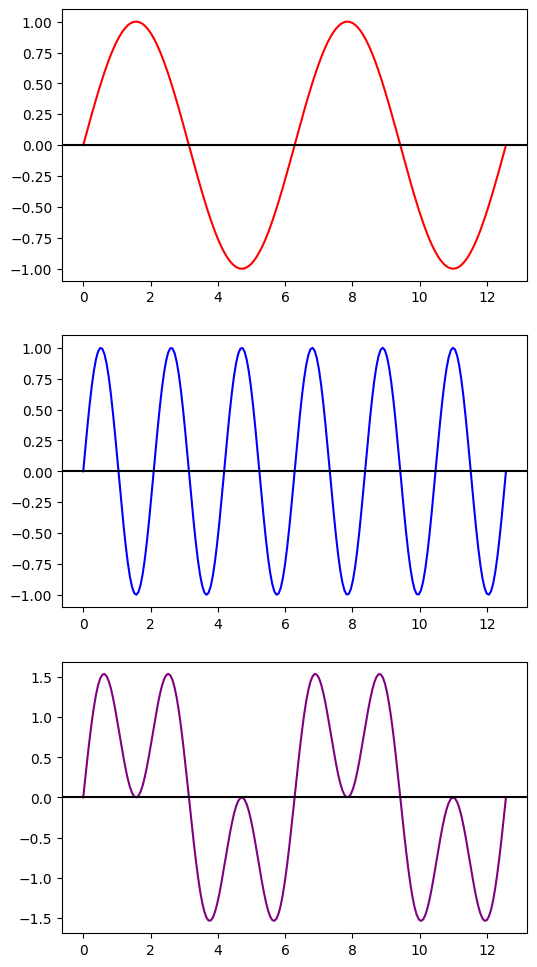

In [11]:
x = np.linspace(0, 4*np.pi, 200)
a = np.sin(x)
b = np.sin(3*x)

fig, (ax1, ax2, ax3) = plt.subplots(3,1,figsize=(6,12))
ax1.plot(x, a, c='r')
ax1.axhline(0, c='k')
ax2.plot(x, b, c='b')
ax2.axhline(0, c='k')
ax3.plot(x, a+b, c='purple')
ax3.axhline(0, c='k')
plt.savefig('sine_example.jpeg')

In [2]:
#spiral_recon, spiral_cos_cos, spiral_sin_cos = beef_it('GZ2_images/293157.jpg', rescale_factor=10, 
#                                  rscale=33, recon_lims=100)

opening image
Reff =  45.434914524837986  Galaxy Radius:  272.6094871490279
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate 7.493571088044606 2.8364626248696054
center finding iteration 0
center finding iteration 50
center finding iteration 100
Center of mass at x = 1.1586380803618415, y = 0.45490448299759967
finding best rscl
New rscl value: 33
updating to new_mmax, new_nmax


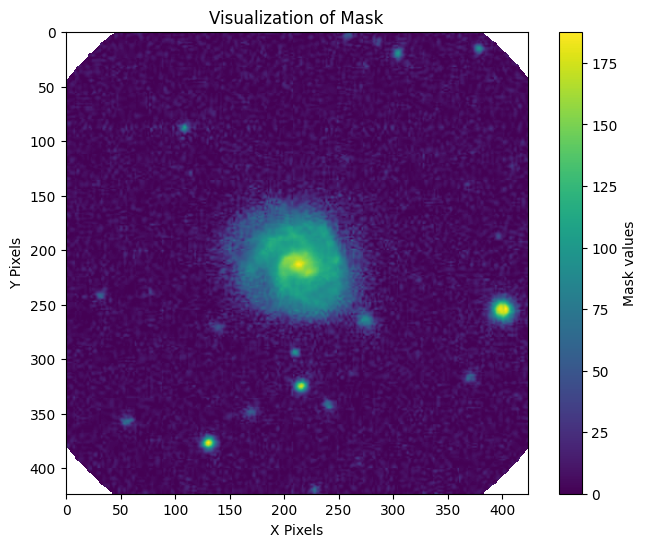

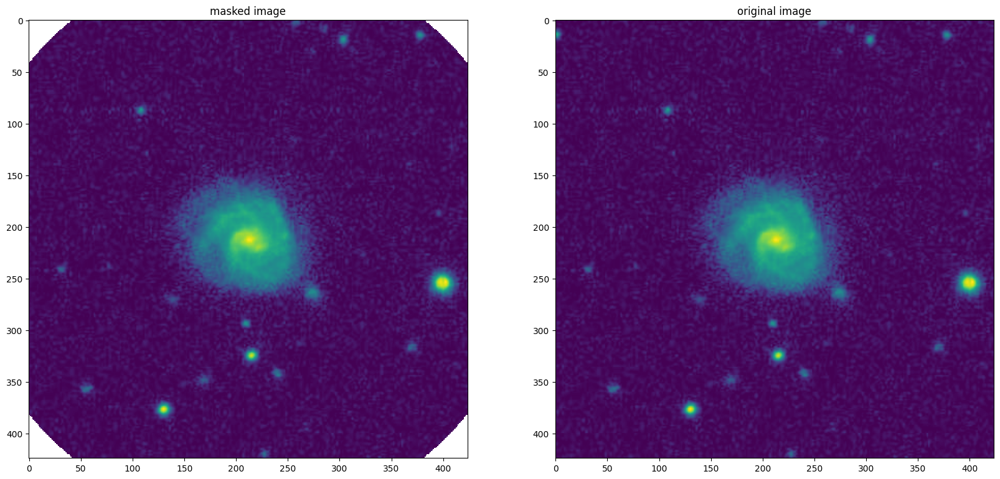

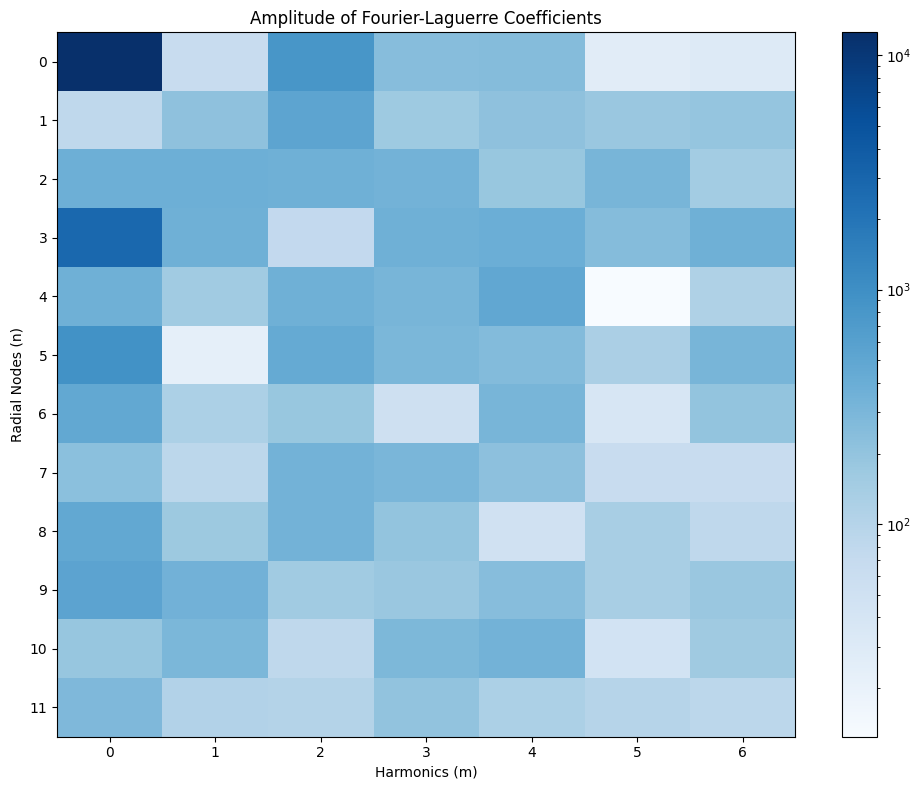

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


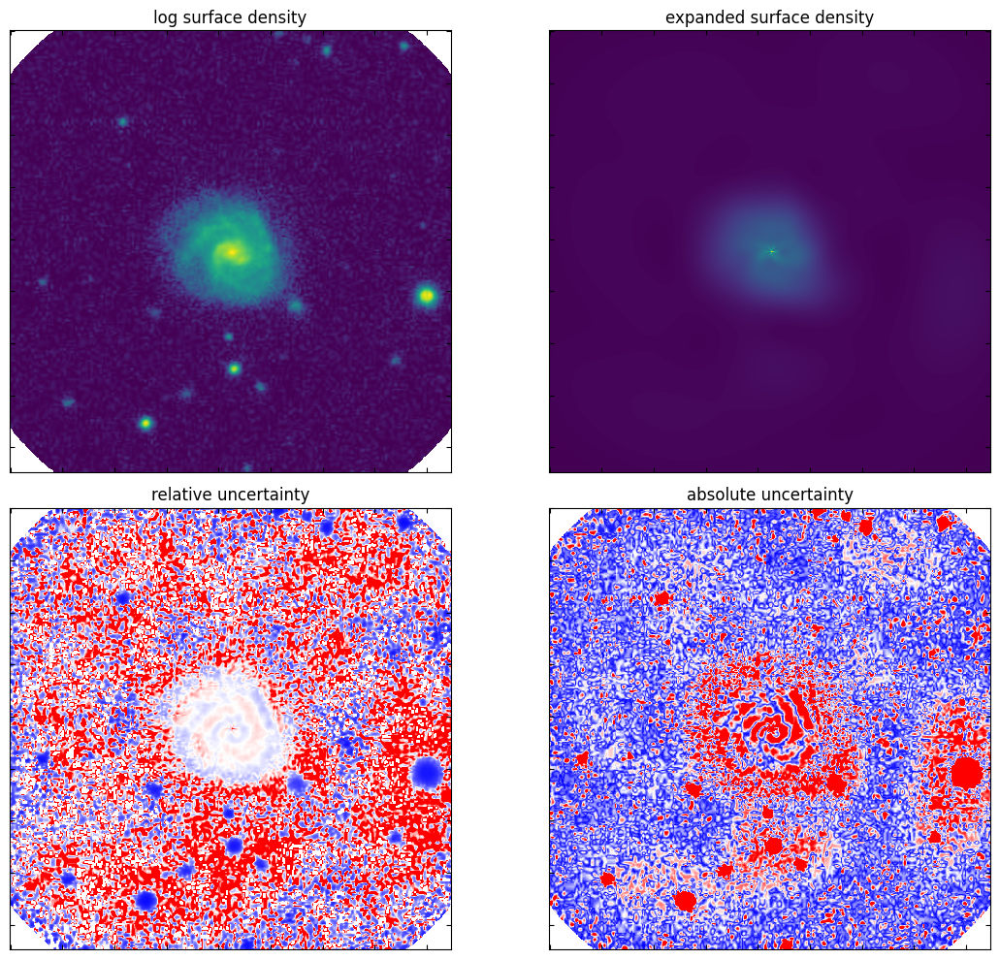

returning cosine coefficients, sine coefficients
it takes  37.0269570350647  to do one expansion


In [3]:
start = time.time()
cos_cos1, sin_cos1 = BeefIt('GZ2_images/293157.jpg', rscl_initial = 50, 
                                        mmax_initial = 2, nmax_initial = 10,
                                       new_mmax = 7, new_nmax = 12)
end = time.time()
print('it takes ', end - start, ' to do one expansion')

opening image
Reff =  39.747269026272534  Galaxy Radius:  238.4836141576352
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate 1.3068299758644164 4.774251214488679
center finding iteration 0
center finding iteration 50
center finding iteration 100
Center of mass at x = 1.7831793891784562, y = 3.1576478874807705
finding best rscl
New rscl value: 26
updating to new_mmax, new_nmax


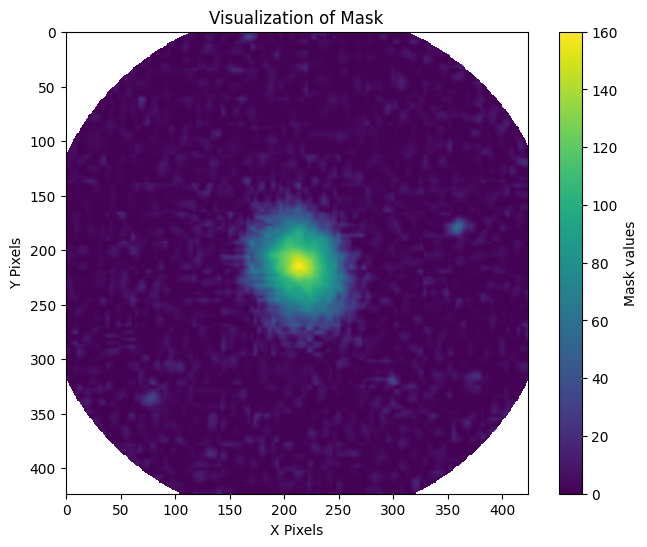

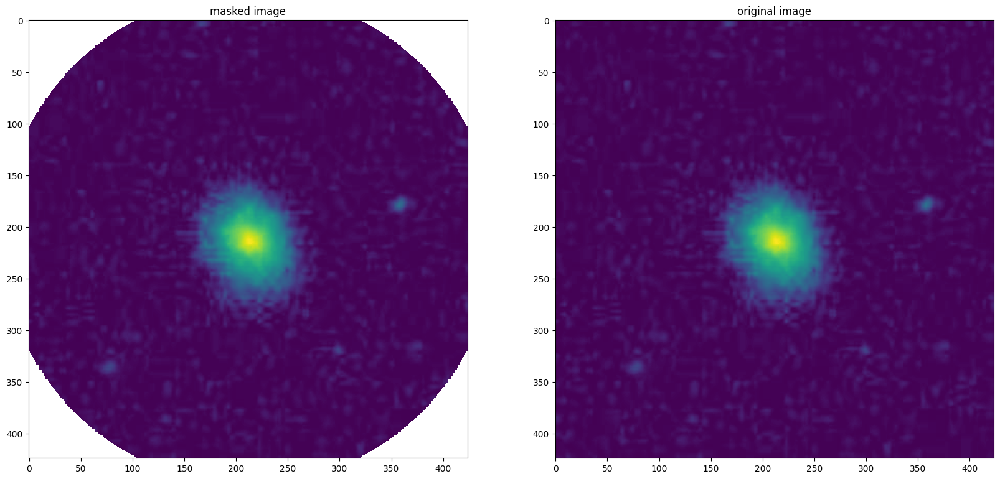

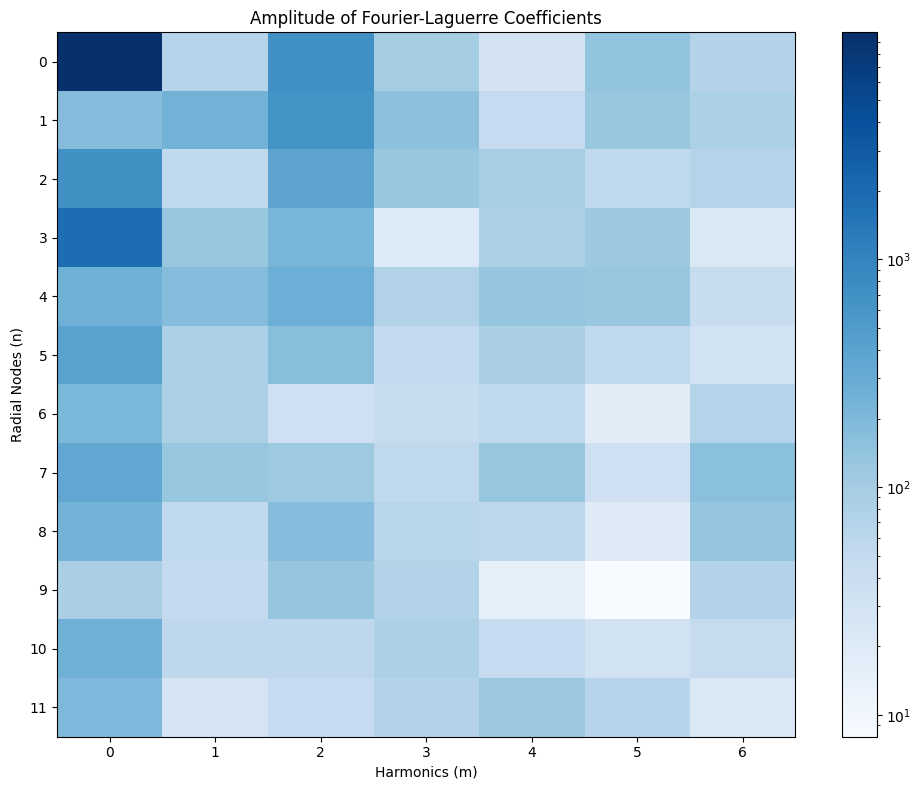

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


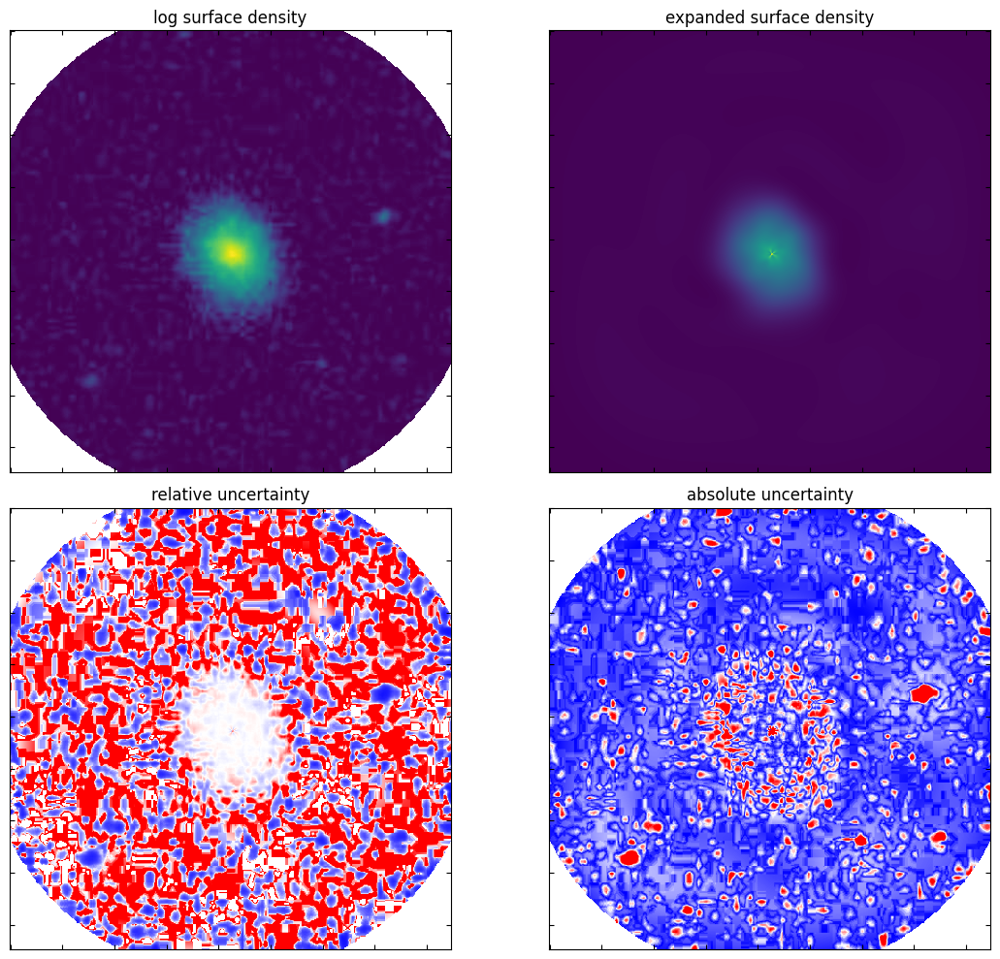

returning cosine coefficients, sine coefficients
it takes  45.27588677406311  to do one expansion


In [161]:
start = time.time()
cos_cos2, sin_cos2 = BeefIt('GZ2_images/762.jpg', rscl_initial = 50, 
                                        mmax_initial = 2, nmax_initial = 10,
                                       new_mmax = 7, new_nmax = 12)
end = time.time()
print('it takes ', end - start, ' to do one expansion')

opening image
Reff =  61.34416521788065  Galaxy Radius:  368.0649913072839
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate -4.923369150691742 -6.234218215779469
center finding iteration 0
center finding iteration 50
center finding iteration 100
center finding iteration 150
center finding iteration 200
Center of mass at x = -0.32659160629461415, y = 0.7290462346977851
finding best rscl
New rscl value: 45
updating to new_mmax, new_nmax


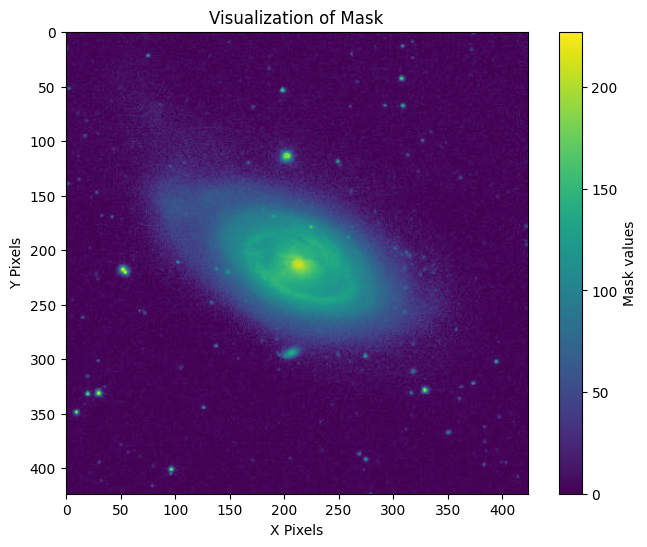

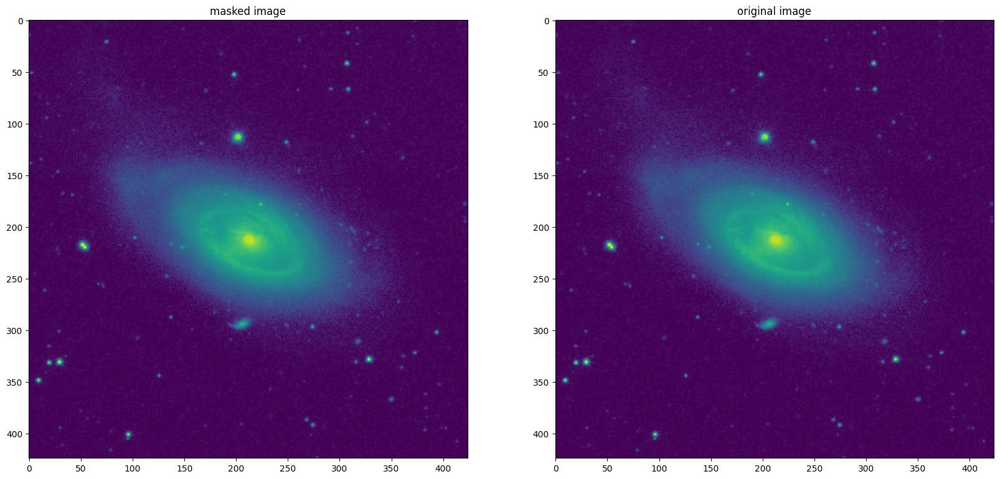

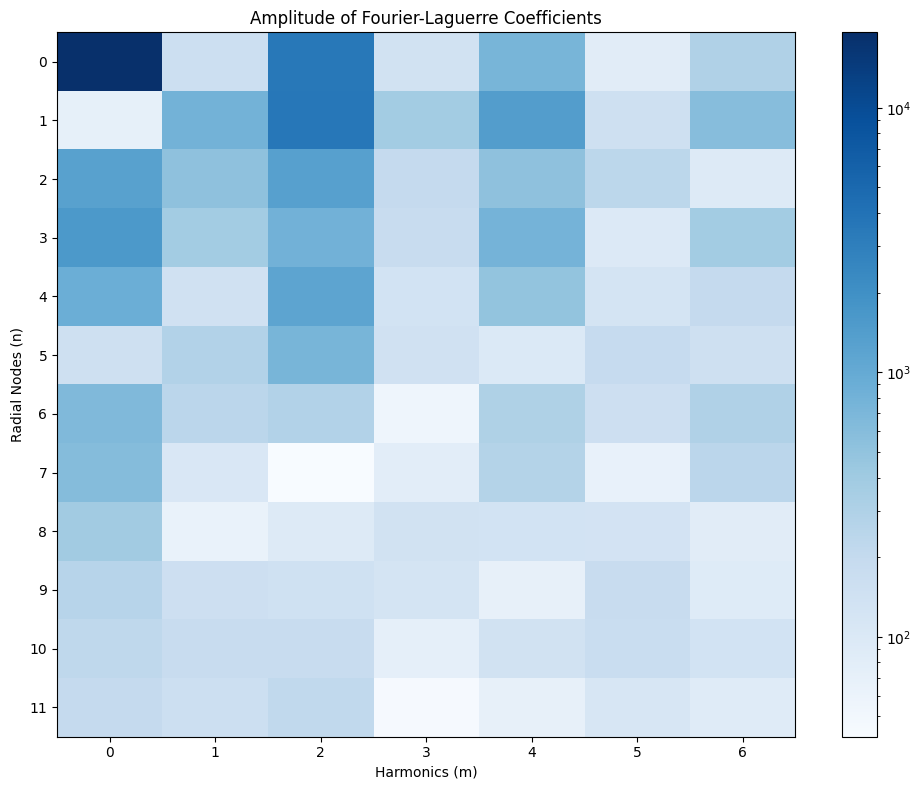

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


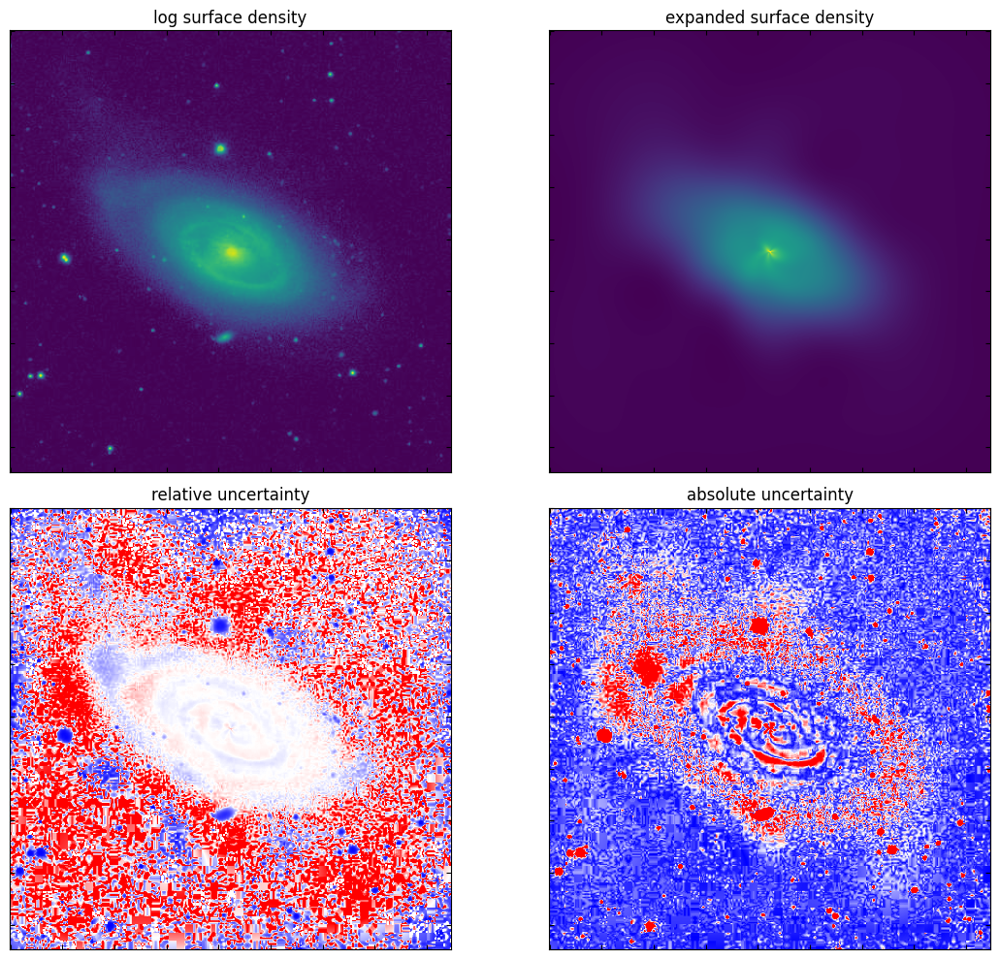

returning cosine coefficients, sine coefficients
it takes  68.27680397033691  to do one expansion


In [160]:
start = time.time()
cos_cos3, sin_cos3 = BeefIt('GZ2_images/835.jpg', rscl_initial = 50, 
                                        mmax_initial = 2, nmax_initial = 10,
                                       new_mmax = 7, new_nmax = 12)
end = time.time()
print('it takes ', end - start, ' to do one expansion')

opening image
Reff =  39.10756941104951  Galaxy Radius:  234.64541646629706
getting pixel info, galaxy radius, mask, etc
finding center of image
center of mass estimate -8.867448713576804 7.251327495683068
center finding iteration 0
center finding iteration 50
center finding iteration 100
center finding iteration 150
Center of mass at x = 0.44175842699570644, y = 0.8265699490288618
finding best rscl
New rscl value: 29
updating to new_mmax, new_nmax


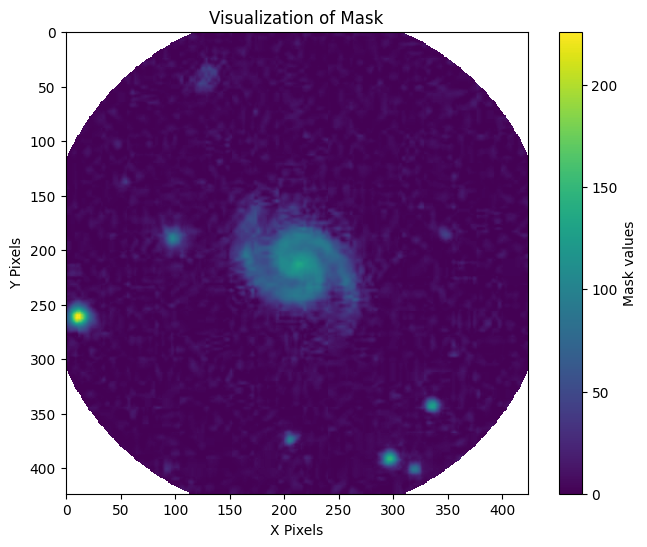

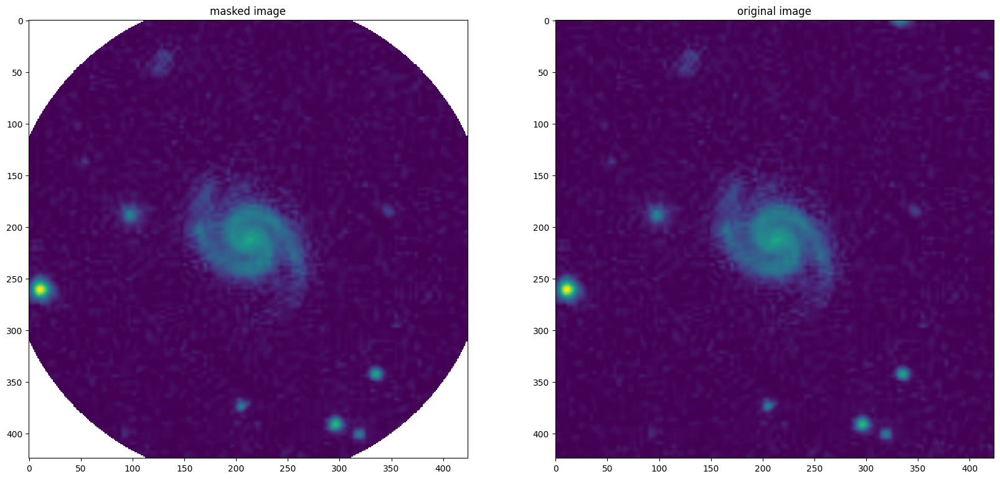

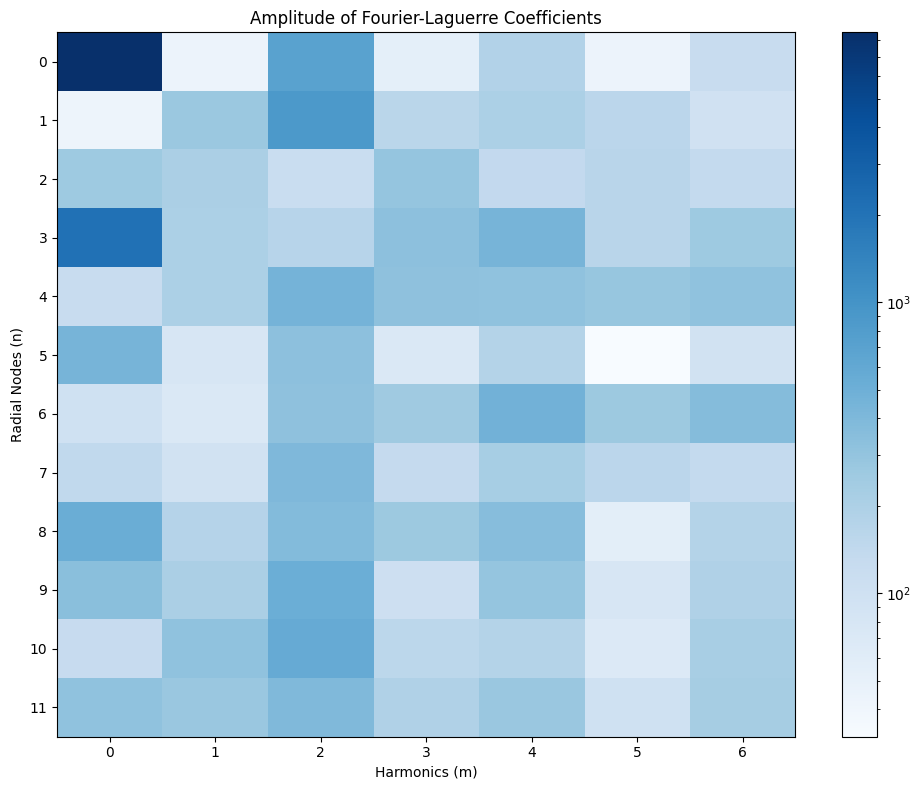

/Users/cfilion/Developer/sonification/FLEX_ed.py:721: RuntimeWarning: divide by zero encountered in divide
  ax3.imshow(((reconstruction - fixed_image) / fixed_image).T,cmap='bwr',vmin=-1,vmax=1)


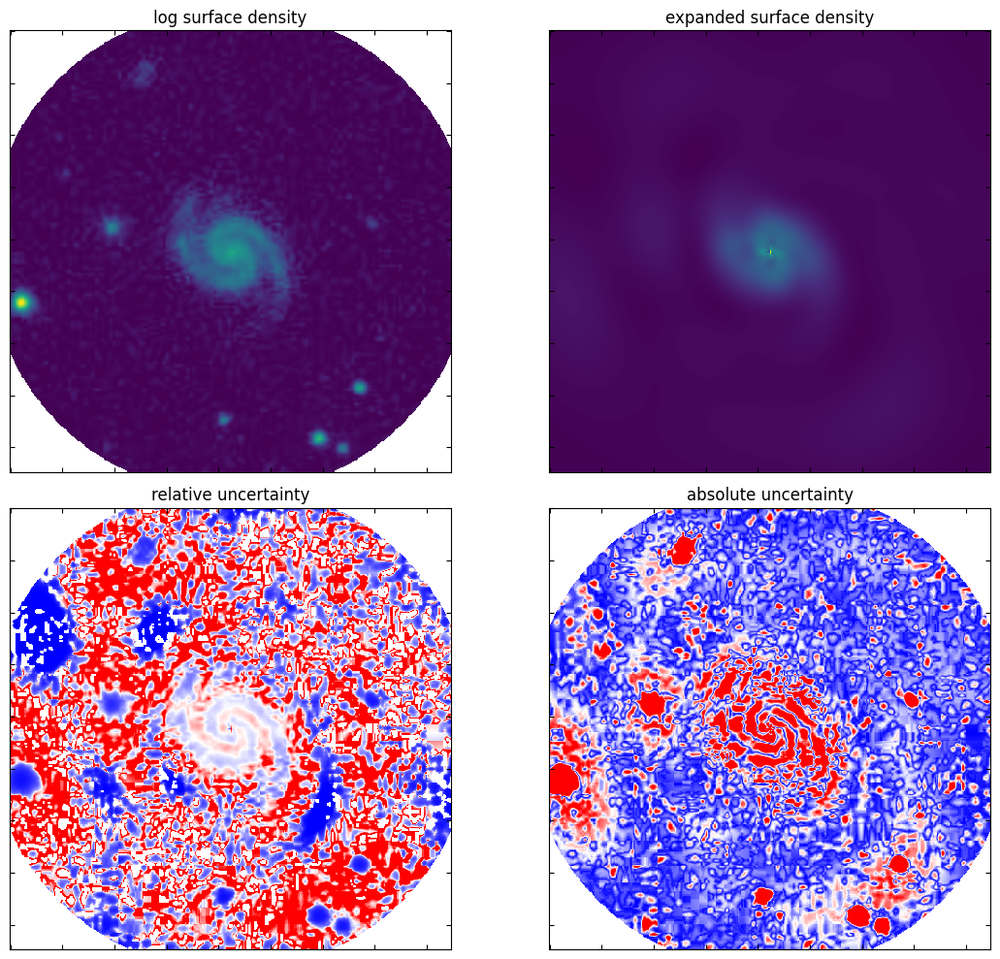

returning cosine coefficients, sine coefficients
it takes  57.37214493751526  to do one expansion


In [223]:
start = time.time()
cos_cos4, sin_cos4 = BeefIt('GZ2_images/1246.jpg', rscl_initial = 50, 
                                        mmax_initial = 2, nmax_initial = 10,
                                       new_mmax = 7, new_nmax = 12)
end = time.time()
print('it takes ', end - start, ' to do one expansion')

In [114]:
#### redoing with just saving out top ten notes?
def mod_map_to_sounds_octave_volume(cos_cos, sin_cos, quiet=True):
    note_list = np.array(['G#', 'G', 'F#', 'F', 'E', 'D#', 'D', 'C#', 'C', 'B', 'A#', 'A'])
    #np.array(['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']) 
    #option one from Mike's overleaf, chromatic, but shifted to have c as center c, c#, d, d#, e, f, f#, g, g#, a, a#, b 
    mmax = cos_cos.shape[0]
    nmax = cos_cos.shape[1]

    modulus = np.sqrt(cos_cos**2 + sin_cos**2)
    note_dict = {}
    amps_array = np.array([])
    note_array = np.array([])
    note_dict = {}
    for m in range(mmax):
        octave = m + 1 #hmm. running into issues that there are only some notes at m = 0 and m = 8... 
        #can kinda avoid bc last few terms are usually low amplitude but not really a fix here...
        for n in range(nmax):
            note_dict[note_list[n]+str(octave)] = modulus[m,n]
            note_array = np.append(note_array, note_list[n]+str(octave))
            amps_array = np.append(amps_array, modulus[m,n])
    print('returning full set of notes')
    return note_dict, note_array, amps_array

In [224]:
one_oct_amp, one_notes, one_amp = mod_map_to_sounds_octave_volume(cos_cos1, sin_cos1)

two_oct_amp, two_notes, two_amp  = mod_map_to_sounds_octave_volume(cos_cos2, sin_cos2)

three_oct_amp, three_notes, three_amp  = mod_map_to_sounds_octave_volume(cos_cos3, sin_cos3)

four_oct_amp, four_notes, four_amp  = mod_map_to_sounds_octave_volume(cos_cos4, sin_cos4)

returning full set of notes
returning full set of notes
returning full set of notes
returning full set of notes


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 149.27it/s]


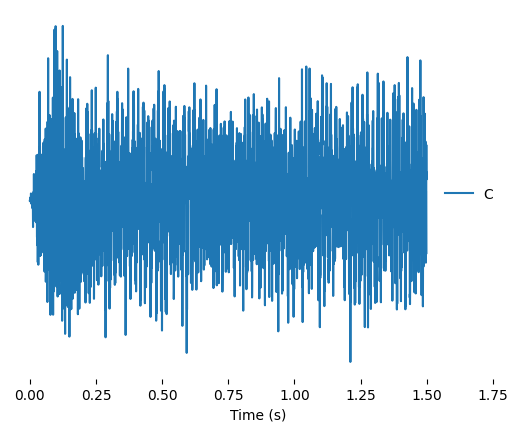

Saved galaxy_1_chromatic_vol_new


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 148.96it/s]


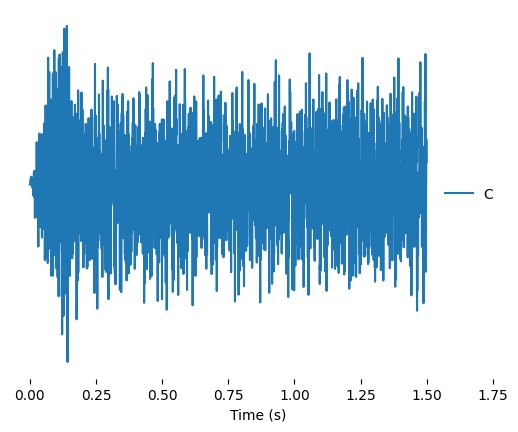

Saved galaxy_2_chromatic_vol_new


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 144.34it/s]


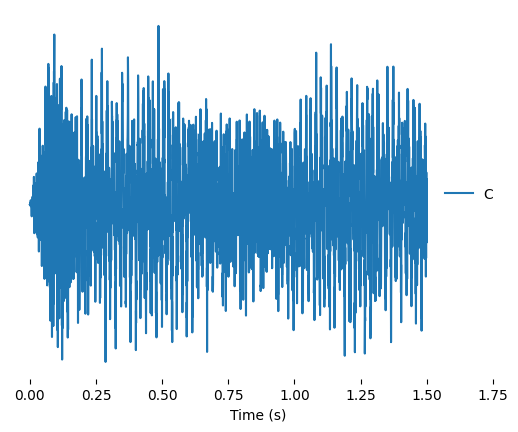

Saved galaxy_3_chromatic_vol_new


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 150.93it/s]


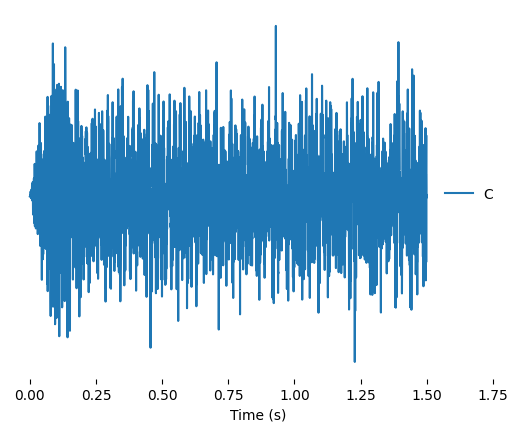

Saved galaxy_4_chromatic_vol_new


In [225]:
# ok starting with cc, which is easiest bc just mapping to octaves
data_list = [one_notes, two_notes, three_notes, four_notes]
amp_list = [one_amp, two_amp, three_amp, four_amp]
name_list = ['galaxy_1_chromatic_vol_new', 'galaxy_2_chromatic_vol_new', 'galaxy_3_chromatic_vol_new', 'galaxy_4_chromatic_vol_new']
length = 1.5 #3 seconds
i = -1

generator = Synthesizer()
#generator.modify_preset({'oscillator':'square'})
generator.load_preset('test')   
for i in range(len(data_list)):
    note_set = data_list[i]
    score =  Score([list(note_set)], length)
    scaled_amp = amp_list[i]/((amp_list[i][48])) #relative to 36 is fine, as is 48
    data = {'pitch': np.ones(len(note_set)),
           'volume': np.log(scaled_amp)} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "mono"
    soni = Sonification(score, sources, generator, system)
    soni.render()
    soni.notebook_display()
    #soni.hear() 
    soni.save(str(name_list[i]))

In [214]:
one_notes[80] #m = 0 at 1st octave, m = 1 at 2nd, m = 2 at 3rd, m = 3 at 4th, m = 4 at 5th, m = 5 at 6th, m = 6 at 7th
one_notes[48], 48/12

(np.str_('G#5'), 4.0)

100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 150.81it/s]


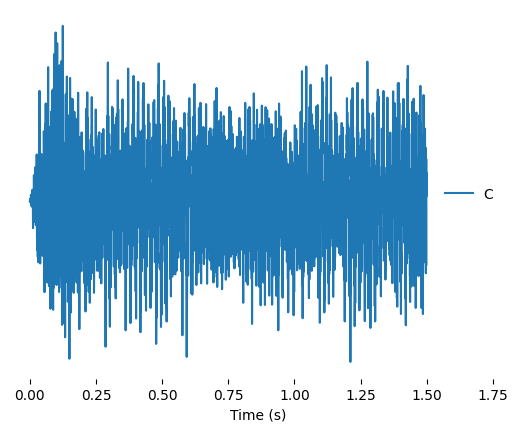

Saved galaxy_1_chromatic_vol


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 138.39it/s]


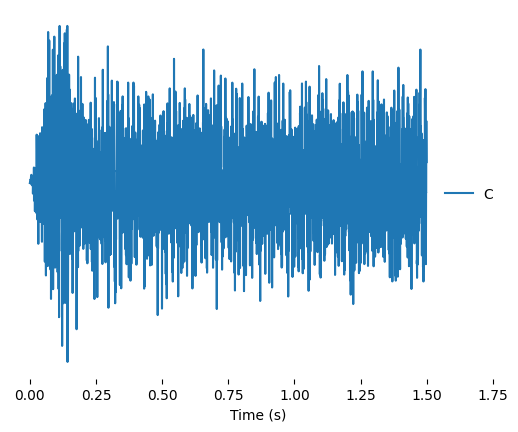

Saved galaxy_2_chromatic_vol


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 162.15it/s]


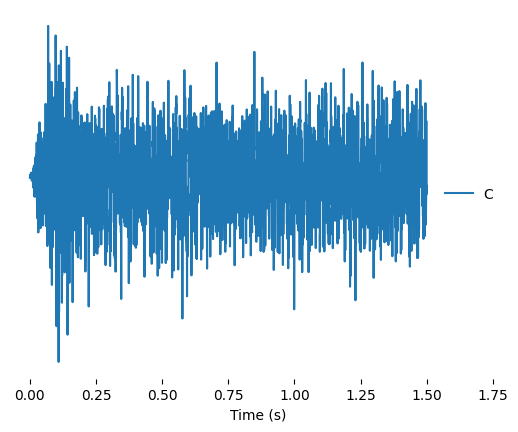

Saved galaxy_3_chromatic_vol


100%|███████████████████████████████████████████████████████████████████████████████████| 84/84 [00:00<00:00, 150.50it/s]


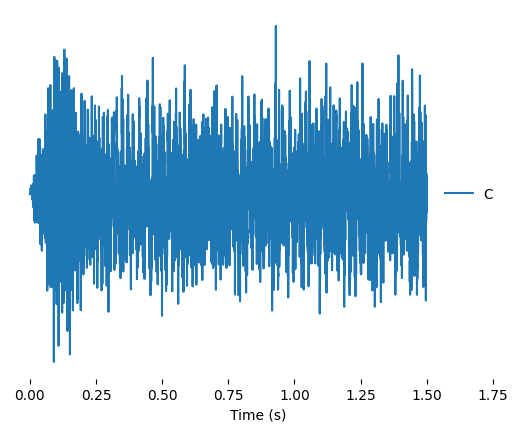

Saved galaxy_4_chromatic_vol


In [226]:
# ok starting with cc, which is easiest bc just mapping to octaves
data_list = [one_notes, two_notes, three_notes, four_notes]
amp_list = [one_amp, two_amp, three_amp, four_amp]
name_list = ['galaxy_1_chromatic_vol', 'galaxy_2_chromatic_vol', 'galaxy_3_chromatic_vol', 'galaxy_4_chromatic_vol']
length = 1.5 #3 seconds
i = -1

generator = Synthesizer()
#generator.modify_preset({'oscillator':'square'})
generator.load_preset('test')   
for i in range(len(data_list)):
    note_set = data_list[i]
    score =  Score([list(note_set)], length)
    scaled_amp = amp_list[i]/(amp_list[i][41])
    data = {'pitch': np.ones(len(note_set)),
           'volume': np.log(scaled_amp)} #eventually want to make volume scale with importance somehow
    sources = Events(data.keys())
    sources.fromdict(data)
    lims = {'time': ('0','101')}
    sources.apply_mapping_functions(map_lims=lims)
    
    system = "mono"
    soni = Sonification(score, sources, generator, system)
    soni.render()
    soni.notebook_display()
    #soni.hear() 
    soni.save(str(name_list[i]))

In [118]:
one_amp, one_notes
#exp(-amplitude) is p interesting
len(one_amp), one_amp[41], one_notes[41]

(84, np.float64(295.5037413555057), np.str_('D#4'))

In [167]:
np.max(two_amp), two_amp[41], np.max(one_amp), one_amp[41], np.max(three_amp), three_amp[41]

(np.float64(9941.482708067919),
 np.float64(49.02373764968666),
 np.float64(12519.221089457724),
 np.float64(295.5037413555057),
 np.float64(19287.070362890576),
 np.float64(138.9584706899788))

volume scaling attempts:
- log(amp)
- log(amp/max(amp))
- 1/log(amp)
- e(-amp)
- amp/max(amp)
- asinh(amp)
- (e^(amp/max(amp)) - 1)/(e - 1)
- sin(amp/max(amp))
- sin(amp/max(amp) + pi/2)
- 1 - (amp/max(amp))^2
- 1 - sqrt(1 - (amp/max(amp))^2)
- e(-amp/(amp at center note))
- amp/(amp at center note)
- 1/(amp/(amp at center note))
- log(amp/(amp at center note)) -> p decent